In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
cos_sim_df = pd.read_parquet(
    "../07.compute-cosine-similarities/cos_sim/cosine_similarities_genes_crispr-all-no-correction.parquet"
)

cos_sim_df.head()

,non-targeting,NMNAT2,PIK3AP1,GOT1,OLR1,CHAT,GNA14,PALS2,MCM6,RAB21,...,SFXN1,BZW2,SLC25A22,GUCA1A,SIX6,SMARCA4,TGIF1,LRSAM1,INPP5B,SPTLC1
non-targeting,1.000000,0.000198,-0.155372,-0.142131,-0.134412,-0.089354,-0.109164,0.028733,0.188457,-0.001575,...,0.014156,-0.076763,0.029949,0.004760,0.011702,0.079479,0.043226,0.198848,0.028288,-0.092342
NMNAT2,0.000198,1.000000,0.317265,0.293904,-0.034857,0.329257,0.349793,0.190879,0.305049,0.048298,...,0.007679,-0.152132,-0.036735,0.098488,-0.138300,-0.075837,0.161809,0.247273,0.111211,-0.037786
PIK3AP1,-0.155372,0.317265,1.000000,0.459136,0.125333,0.473906,0.238930,0.105264,0.037498,0.144313,...,0.266539,0.013586,0.112145,0.188767,0.138911,-0.062433,0.174342,0.005957,0.033262,0.145084
GOT1,-0.142131,0.293904,0.459136,1.000000,0.249129,0.396783,0.424852,0.127800,0.198454,0.339000,...,0.240508,0.078663,0.093205,0.261955,0.092529,0.046214,0.024140,-0.013267,0.001690,0.120112
OLR1,-0.134412,-0.034857,0.125333,0.249129,1.000000,0.191150,0.308245,0.183074,-0.048855,0.251311,...,0.209641,0.212062,0.014415,0.014148,0.174049,0.007347,0.064900,0.105497,0.044881,0.126412


In [3]:
chromosome_df = pd.read_csv(
    "../00.download-and-process-annotations/output/gene_chromosome_location_processed.tsv",
    sep="\t", usecols=["Approved_symbol", "Chromosome_number", "Arm_name"]
)

chromosome_df.replace({"Chromosome_number": {"X": 23, "Y": 24}}, inplace=True)

chromosome_df["Chromosome_number"] = chromosome_df["Chromosome_number"].astype(int)

chromosome_df = (
    chromosome_df.assign(Chromosome_arm=lambda x: x.apply(lambda y: f'{y.Chromosome_number:02}{y.Arm_name}', axis=1)) # Add leading zero
)

chromosome_df.head()

,Approved_symbol,Chromosome_number,Arm_name,Chromosome_arm
0,A1BG,19,q,19q
1,A1BG-AS1,19,q,19q
2,A1CF,10,q,10q
3,A2M,12,p,12p
4,A2M-AS1,12,p,12p


In [4]:
genes_df = pd.DataFrame(
    {"Approved_symbol": cos_sim_df.columns},
    index=[i for i in range(len(cos_sim_df.columns))],
)

genes_df = genes_df.merge(chromosome_df, how="inner", on="Approved_symbol")

genes_df = genes_df.sort_values(by=["Chromosome_number", "Arm_name"]).reset_index(drop=True)

genes_df.head()

,Approved_symbol,Chromosome_number,Arm_name,Chromosome_arm
0,PRDX1,1,p,01p
1,DFFA,1,p,01p
2,PADI3,1,p,01p
3,CD2,1,p,01p
4,FABP3,1,p,01p


In [5]:
# Compute borderline index when chromosome number changes
chrom_group = genes_df.groupby('Chromosome_number').groups
chrom_idx = []
for gp in chrom_group:
    chrom_idx.append(chrom_group[gp][0])
chrom_idx.sort()

# Compute borderline index when chromosome arm changes
locus_group = genes_df.groupby('Chromosome_arm').groups
arm_idx = []
for gp in locus_group:
    idx = locus_group[gp][0]
    if idx not in chrom_idx:
        arm_idx.append(idx)
arm_idx.sort()

In [6]:
genes = genes_df.Approved_symbol.to_list()

cos_sim_df = cos_sim_df.loc[genes, genes]

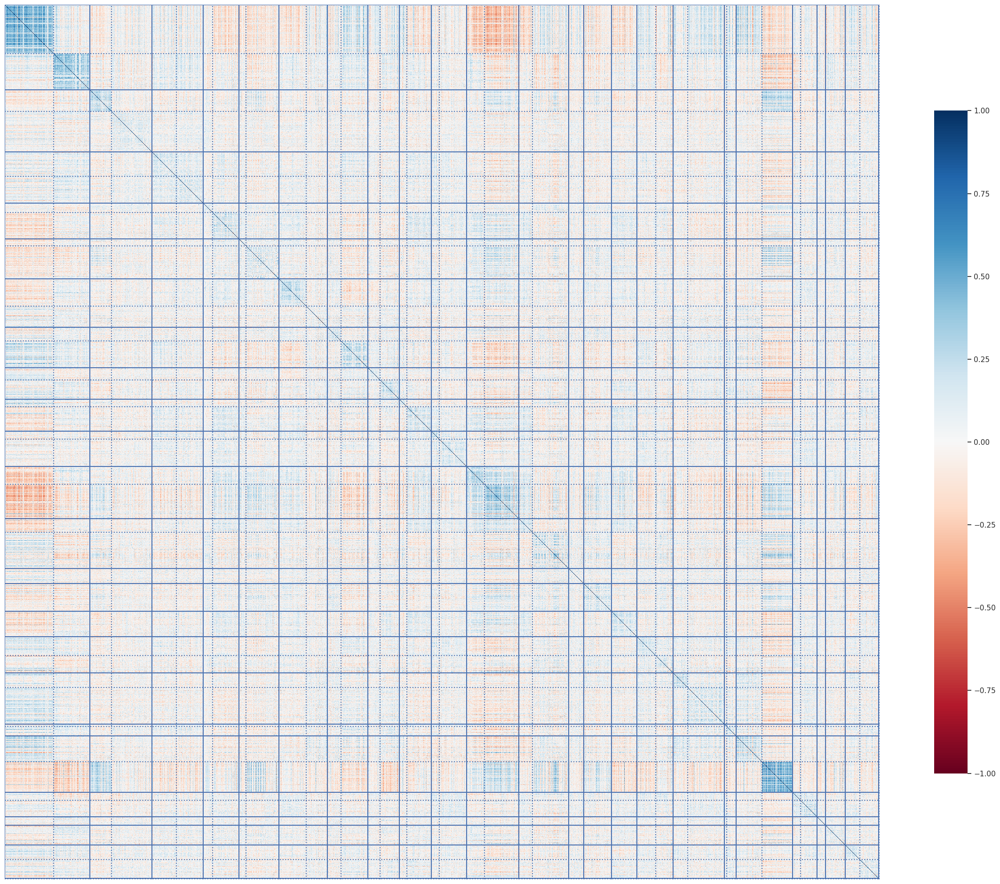

In [7]:
sns.set(rc={"figure.figsize": (30, 30)})

ax = sns.heatmap(
    cos_sim_df,
    cmap="RdBu",
    square=True,
    vmin=-1, 
    vmax=1,
    xticklabels=False,
    yticklabels=False,
    cbar_kws={"shrink": 0.61},
)

ax.hlines(chrom_idx, *ax.get_xlim())
ax.hlines(arm_idx, linestyles='dotted', *ax.get_xlim())
ax.vlines(chrom_idx, *ax.get_ylim())
ax.vlines(arm_idx, linestyles='dotted', *ax.get_ylim())

plt.savefig("figures/crispr-chromosome-arm-similarity-no-correction.png", dpi=300)
